In [1]:
import os

# Set before running shap.kmeans
os.environ['OMP_NUM_THREADS'] = '8' 

# Import required libraries for data manipulation, ML, and interpretability
import math
import re
import machine_learning_datasets as mldatasets
import pandas as pd
import numpy as np
import nltk
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap  # For SHapley Additive exPlanations
import lime  # For Local Interpretable Model-agnostic Explanations
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

### Understanding and Preparing the Data

In [2]:
# THE MISSION: EXPLAINING CHOCOLATE BAR RATINGS
#
# THE CLIENT & THE PROBLEM:
# - Client: A high-end French chocolate manufacturer.
# - The Paradox: They are puzzled by a mismatch between expert ratings, market research, and actual sales.
#   - ✓ Some of their bars rated "Outstanding" by critics have mediocre sales.
#   - ⚠ Other bars rated "Disappointing" have impressive sales.
#   - Their goal is to understand the "why" behind these specific, paradoxical cases.
#
# THE DATASET:
# - Source: The Manhattan Chocolate Society, a group of expert chocolate tasters.
# - Content: Over 2,200 chocolate bar ratings, which happen to align well with the client's sales data.
# - Target Variable (Ratings): A 1.0 to 5.0 scale with clear labels:
#   - 4.0–5.0 = Outstanding
#   - 3.5–3.9 = Highly Recommended
#   - 3.0–3.4 = Recommended
#   - 2.0–2.9 = Disappointing
#   - 1.0–1.9 = Unpleasant
# - Features: A mix of tabular and text data like:
#   - Bean origin (country)
#   - Number of ingredients
#   - Presence of salt
#   - Descriptive words used by raters.
#
# THE GOAL: LOCAL INTERPRETATION
# - The primary objective is NOT to build the world's best chocolate rating predictor.
# - The goal is to use a model to explain specific, individual outcomes:
#   1. Why is one of the manufacturer's bars (high sales) rated as "Disappointing"?
#   2. Why is another of their bars (low sales) rated as "Outstanding"?
#
# THE APPROACH: A MULTI-MODEL STRATEGY
# 1. FRAME THE PROBLEM:
#    - Binary Classification: Predict if a chocolate bar's rating is >= "Highly Recommended" (3.5+).
#      This aligns with the client's desire for all their bars to meet this quality threshold.
#
# 2. TRAIN TWO SEPARATE BLACK-BOX MODELS:
#    - Model 1 (Tabular Data): Support Vector Machine (SVM) will be trained on features like bean origin, ingredient count, etc.
#    - Model 2 (Text Data): LightGBM will be trained on the NLP features (descriptive words).
#
# 3. LEVERAGE LOCAL INTERPRETATION METHODS:
#    - The core of the mission is to use two key model-agnostic tools to explain individual predictions.
#      - ✓ SHAP (SHapley Additive exPlanations)
#      - ✓ LIME (Local Interpretable Model-agnostic Explanations)
#
# 4. SYNTHESIZE AND COMPARE:
#    - The insights from SHAP and LIME will be combined to provide a "richer explanation" for the client.
#    - The process will also serve as a case study to compare the strengths and limitations of both methods.

In [6]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings_v2")

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings_v2.zip downloaded to D:\Tutorials\2025\XAI\05_Local_Model-Agnostic_Interpretation_Methods\data\chocolate-ratings_v2.zip
D:\Tutorials\2025\XAI\05_Local_Model-Agnostic_Interpretation_Methods\data\chocolate-ratings_v2.zip uncompressed to D:\Tutorials\2025\XAI\05_Local_Model-Agnostic_Interpretation_Methods\data\chocolate-ratings_v2
1 dataset files found in D:\Tutorials\2025\XAI\05_Local_Model-Agnostic_Interpretation_Methods\data\chocolate-ratings_v2 folder
parsing D:\Tutorials\2025\XAI\05_Local_Model-Agnostic_Interpretation_Methods\data\chocolate-ratings_v2\chocolate_v2.csv


In [7]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,1,0,0,0,1,0,cocoa,blackberry,robust,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,1,0,0,0,1,0,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,1,0,0,0,1,0,rich,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,1,0,1,0,1,0,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,1,0,1,0,1,0,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,1,0,0,1,0,1,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,1,0,0,0,1,0,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,1,0,0,0,1,0,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,1,0,0,0,1,0,fatty,mild nuts,mild fruit,NaN


In [8]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   company                  2224 non-null   object 
 1   company_location         2224 non-null   object 
 2   review_date              2224 non-null   int64  
 3   country_of_bean_origin   2224 non-null   object 
 4   cocoa_percent            2224 non-null   float64
 5   rating                   2224 non-null   float64
 6   counts_of_ingredients    2224 non-null   int64  
 7   cocoa_butter             2224 non-null   int64  
 8   vanilla                  2224 non-null   int64  
 9   lecithin                 2224 non-null   int64  
 10  salt                     2224 non-null   int64  
 11  sugar                    2224 non-null   int64  
 12  sweetener_without_sugar  2224 non-null   int64  
 13  first_taste              2219 non-null   object 
 14  second_taste            

In [9]:
# The data dictionary comprises the following:

# • company: Categorical; the manufacturer of the chocolate bar (out of over 500 different ones)

# • company_location: Categorical; the country of the manufacturer (66 different countries)

# • review_date: Continuous; the year in which the bar was reviewed (from 2006 to 2020)

# • country_of_bean_origin: Categorical; the country where the cocoa beans were harvested 
# (62 different countries)

# • cocoa_percent: Categorical; what percentage of the bar is cocoa

# • rating: Continuous; the rating given by the Manhattan Chocolate Society (possible values: 1–5)

# • counts_of_ingredients: Continuous; the amount of ingredients in the bar

# • cocoa_butter: Binary; was it made with cocoa butter? 

# • vanilla: Binary; was it made with vanilla? 

# • lecithin: Binary; was it made with lecithin? 

# • salt: Binary; was it made with salt? 

# • sugar: Binary; was it made with sugar?

# • sweetener_without_sugar: Binary; was it made with sweetener without sugar? 

# • first_taste: Text; word(s) used to describe the first taste

# • second_taste: Text; word(s) used to describe the second taste

# • third_taste: Text; word(s) used to describe the third taste

# • fourth_taste: Text; word(s) used to describe the fourth taste

#### Data Preparation

In [10]:
# Extract taste columns (first through fourth taste descriptors)
# These contain text descriptions like "fruity", "nutty", "rich", etc.
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]

# Remove taste columns from main dataframe to process separately
chocolateratings_df = chocolateratings_df.drop(
    ['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], 
    axis=1
)

# View sample of taste data
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,roast,high astringent,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich,long,NaN
89,creamy,fruit,cocoa,NaN


In [11]:
# Create dummy variables for company_location with threshold 0.03333 (3.33%)
# Only locations appearing in >3.33% of data get their own column
chocolateratings_df = mldatasets.make_dummies_with_limits(
    chocolateratings_df, 
    'company_location', 
    0.03333
)

# Create dummy variables for country_of_bean_origin with same threshold
chocolateratings_df = mldatasets.make_dummies_with_limits(
    chocolateratings_df, 
    'country_of_bean_origin', 
    0.03333
)

In [12]:
# After all your make_dummies_with_limits calls
bool_cols = chocolateratings_df.select_dtypes(include='bool').columns
chocolateratings_df[bool_cols] = chocolateratings_df[bool_cols].astype(int)

In [13]:
# Combine all taste columns into single string per chocolate bar
# Replace NaN with empty string, join columns with space, strip whitespace
tastes_s = tastes_df.replace(np.nan, '', regex=True).agg(' '.join, axis=1).str.strip()
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [14]:
 # As expected, this series is the same length as the chocolateratings_df DataFrame

In [15]:
# Check unique taste combinations (2178 unique combinations from 2224 chocolates)
print(np.unique(tastes_s).shape)

(2178,)


In [16]:
# the output is (2178,), that means fewer than 50 phrases are duplicated, so tokenizing by phrases would 
# be a bad idea since so few of them are repeated. After all, when tokenizing, we want the elements to 
# repeat enough times to make it worthwhile. 

In [17]:
# There are many approaches you could take here, such as tokenizing by bi-grams (sequences of two 
# words) or even subwords (dividing words into logical parts). However, even though order matters 
# slightly (because the first words are related to the first taste, and so on), our dataset is too small and 
# had too many nulls (especially in third taste and fourth taste) to derive meaning from the order. 
# This is why it was a good choice to concatenate all the “tastes” together, thus removing their discernible
# division. 

# Another thing to note is that our words are (mostly) adjectives such as “fruity” and “nutty”. We made a 
# small effort to remove adverbs such as “sweetly”, but there are still some nouns present, such as “fruit” 
# and “nuts”, versus adjectives such as “fruity” and “nutty”. We can’t be sure if the chocolate connoisseurs 
# who judged the bars meant something different by using “fruit” rather than “fruity”. However, if we 
# were sure of this, we could have performed stemming or lemmatization to turn all instances of “fruit”, 
# “fruity”, and “fruitiness” into a consistent “fru” (stem) or “fruiti” (lemma). We won’t concern ourselves 
# with this because many of our adjectives’ variations are not as common in the phrases anyway.

In [18]:
# Download NLTK punkt tokenizer for word tokenization
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [19]:
# Create frequency distribution of all taste words across dataset
# Tokenize all taste strings and count word occurrences
tastewords_fdist = FreqDist(word for word in word_tokenize(tastes_s.str.cat(sep=' ')))

# Convert frequency distribution to dataframe
tastewords_df = pd.DataFrame.from_dict(
    tastewords_fdist, 
    orient='index'
).rename(columns={0:'freq'})

# Extract common tastes (appearing more than 74 times)
# These will become binary features indicating presence/absence of each taste
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


In [20]:
# from the following output for commontastes_l, the most common words are mostly 
# different (except for spice and spicy)

In [21]:
# Something we can do with this list to enhance our tabular dataset is turn these common words 
# into binary features. In other words, there will be a column for each one of these “common tastes” 
# (commontastes_l), and if the “tastes” for the chocolate bar include it, the column will contain a 1, 
# otherwise a 0. Fortunately, we can easily do this with two lines of code. First, we create a new column 
# with our text-tastes series (tastes_s). Then, we use the make_dummies_from_dict function we used in 
# the last chapter to generate the dummy features by looking for each “common taste” in the contents 
# of our new column

In [22]:
# Add combined tastes string back to main dataframe
chocolateratings_df['tastes'] = tastes_s

# Create binary dummy variables for each common taste word
# If taste word appears in chocolate's description, column = 1, else 0
chocolateratings_df = mldatasets.make_dummies_from_dict(
    chocolateratings_df, 
    'tastes', 
    commontastes_l
)

In [23]:
chocolateratings_df.info()

# The output has all numeric non-null features except for company. There are over 500 companies, so 
# categorical encoding of this feature would be complicated and, because it would be advisable to 
# bucket most companies as Other, it would likely introduce bias toward the few companies that are 
# most represented. Therefore, it’s better to remove this column altogether.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

In [24]:
chocolateratings_df

,company,review_date,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,...,tastes_earthy,tastes_spice,tastes_molasses,tastes_floral,tastes_spicy,tastes_woody,tastes_coffee,tastes_berry,tastes_vanilla,tastes_creamy
0,5150,2019,76.0,3.75,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
1,5150,2019,76.0,3.50,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,5150,2019,76.0,3.25,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,A. Morin,2012,63.0,3.75,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,A. Morin,2012,70.0,3.50,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,2014,80.0,2.75,4,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2220,Zotter,2017,75.0,3.75,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2221,Zotter,2018,72.0,3.50,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2222,Zotter,2018,70.0,3.25,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [25]:
# Set random seed for reproducibility
rand = 9

# Create binary target variable: 1 if rating >= 3.5 (highly recommended), else 0
y = chocolateratings_df['rating'].apply(lambda x: 1 if x >= 3.5 else 0)

# Features: all columns except rating and company name
X = chocolateratings_df.drop(['rating', 'company'], axis=1).copy()

# Split into training (67%) and test (33%) sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.33, 
    random_state=rand
)

In [26]:
# Create NLP versions with just taste text for text classification model
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

## Leveraging SHAP’s KernelExplainer for Local Interpretations with SHAP Values

### Train C-Support Vector Classification (CSVC) Model

In [27]:
# SUPPORT VECTOR MACHINES (SVM) & C-SVC
#
# THE CORE CONCEPT: FINDING THE OPTIMAL HYPERPLANE
# - SVM is a family of models that operates in a high-dimensional space.
# - Goal: To find an optimal "hyperplane" (a decision boundary) that best separates the classes.
# - Key Idea: It seeks the hyperplane that has the MAXIMUM MARGIN (the widest possible gap) between the classes.
# - Support Vectors: These are the critical data points that lie closest to the hyperplane. If these points were removed, the position of the hyperplane would change.
# - The Kernel Trick: A computationally efficient method that allows SVMs to operate in high-dimensional space and find non-linear decision boundaries, even though "hyperplane" sounds linear.
#
# THE C-SVC IMPLEMENTATION (SCIKIT-LEARN)
# - The specific model used is `C-SVC` from scikit-learn.
# - Key Hyperparameters:
#   - ✓ `C`: An L2 regularization parameter. It controls the trade-off between a smooth decision boundary and correctly classifying training points.
#   - ✓ `kernel`: The function used for the kernel trick. The default is 'RBF' (Radial Basis Function), which is decidedly non-linear.
#   - ✓ `gamma`: (For the RBF kernel). Defines the radius of influence of each training example.
#     - It has an INVERSELY PROPORTIONAL effect:
#       - A LOW gamma value creates a LARGE radius of influence (smoother boundary).
#       - A HIGH gamma value creates a SMALL radius of influence (tighter, more complex boundary).
#     - The code uses `gamma='auto'`, which scikit-learn sets to `1 / n_features`.
#
# ⚠ A NOTE ON PROBABILITIES
# - SVMs are based on linear algebra and DO NOT natively produce probability scores.
# - To get probabilities, you must set `probability=True`.
# - When this is set, scikit-learn runs an expensive cross-validation process and fits a separate Logistic Regression model
#   on top of the SVM's output scores to ESTIMATE the final probabilities.
#
# ADVANTAGES & DISADVANTAGES OF SVMs
# ✓ ADVANTAGES:
#   - Highly effective and efficient when the number of features is large compared to the number of observations.
#   - Can find latent (hidden) non-linear relationships in the data.
#   - Tends to be resistant to overfitting and instability.
#
# ⚠ DISADVANTAGES:
#   - Not as scalable to very large datasets (in terms of observations).
#   - Hyperparameters (`C` and `gamma`) can be difficult and unintuitive to tune.

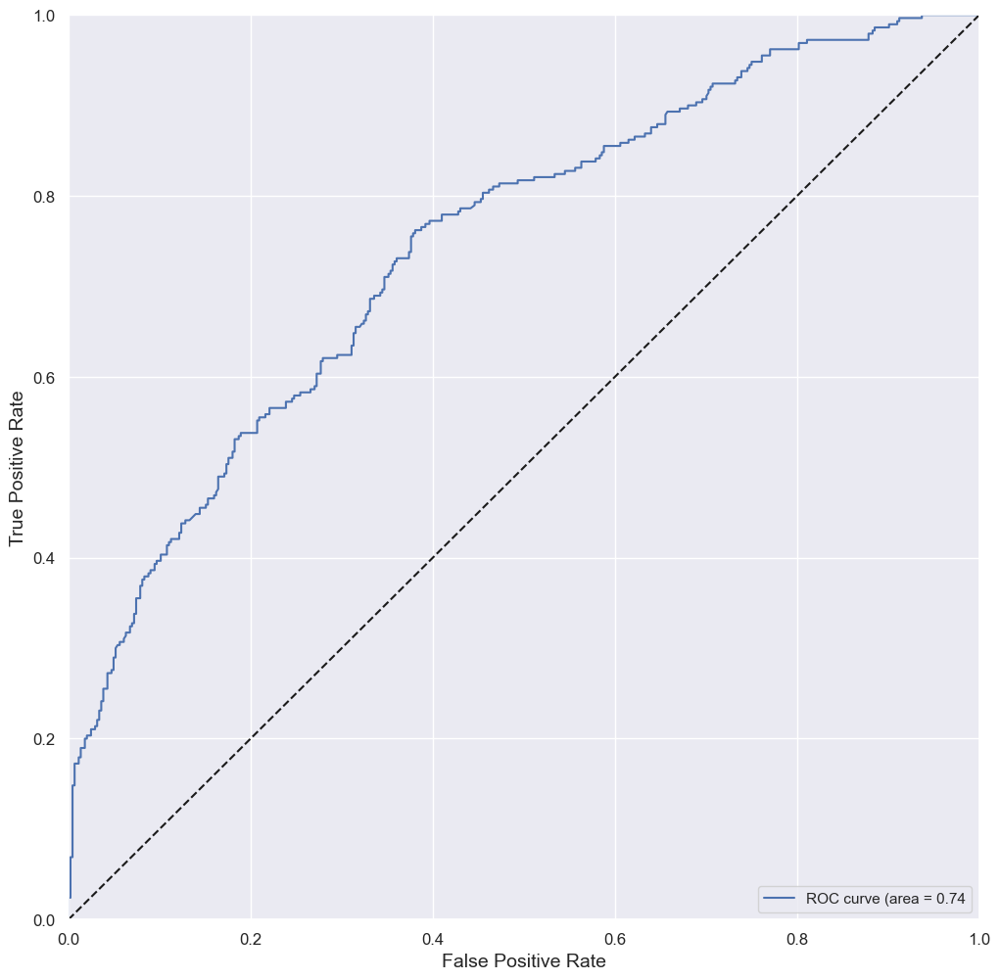

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [28]:
# Save original matplotlib parameters and set seaborn style
orig_plt_params = plt.rcParams
sns.set()

# Train Support Vector Classification model with probability estimates
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)

# Evaluate model performance on train and test sets
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred = mldatasets.evaluate_class_mdl(
    fitted_svm_mdl, 
    X_train, X_test, 
    y_train, y_test
)
# Results: Test Accuracy: 69.89%, Precision: 68.45%, Recall: 44.14%

In [29]:
# the performance achieved is not bad, considering this is a small imbalanced dataset in 
# an already challenging domain for machine learning models’ user ratings. In any case, the Area Under 
# the Curve (AUC) curve is above the dotted coin toss line, and the Matthews correlation coefficient 
# (MCC) is safely above 0. More importantly, precision is substantially higher than recall, and this is very 
# good given the hypothetical cost of misclassifying a lousy chocolate bar as Highly Recommended. We 
# favor precision over recall because we would prefer to have fewer false positives than false negatives.

### Computing SHAP Values using KernelExplainer

In [30]:
# RECAP: MODEL-SPECIFIC VS. MODEL-AGNOSTIC EXPLAINERS
# - The SHAP library offers several model-specific explainers that are fast because they leverage a model's internal structure:
#   - `TreeExplainer` (for tree-based models)
#   - `DeepExplainer` / `GradientExplainer` (for neural networks)
# - `KernelExplainer` is the universal, MODEL-AGNOSTIC option that works for any model.
#
# HOW KERNELEXPLAINER WORKS (ITS SHORTCUTS)
# To manage the intense computation of pure Shapley values, KernelExplainer uses two main shortcuts:
#
# 1. Samples Coalitions: It uses a SUBSET of all possible feature permutations instead of calculating all of them.
# 2. Uses a LIME-inspired Weighting Scheme: It weights the sampled coalitions based on their size, a method
#    borrowed from LIME to ensure the final values are compliant with Shapley properties.
#
# ⚠ A "NEAR-FATAL FLAW" AND ITS IMPLICATIONS
# - The Problem: When simulating "missing" features in a coalition, KernelExplainer randomly samples values
#   from a background training dataset.
# - The Consequences:
#   1. VIOLATES DUMMY PROPERTY: A feature that should have zero importance can be assigned non-zero importance.
#   2. MULTICOLLINEARITY ISSUE: Just like Permutation Importance, if features are correlated, this random sampling
#      can create unrealistic data points, putting too much weight on unlikely instances.
# - Despite this flaw, KernelExplainer is still valuable for its other Shapley properties and its LIME-like advantages.
#
# PRACTICAL IMPLEMENTATION & SETUP
#
# STEP 1: CHECK CLASS ORDER (CRUCIAL FOR CLASSIFICATION)
# - Why it's important: For classification, the explainer outputs a LIST of SHAP value arrays, one for each class.
#   The order of this list is determined by the model's internal class order.
# - How to check: Use `print(model.classes_)`.
# - Example Output: `array([0, 1])` confirms that index `0` corresponds to the "Not Highly Recommended" class,
#   and index `1` corresponds to the "Highly Recommended" class we want to explain.
#
# STEP 2: PREPARE BACKGROUND DATA
# - To minimize computation, you don't use the entire training set as background data.
# - Two common methods:
#   1. K-Means Summary (used in the code): Cluster the training data into `k` centroids (`shap.kmeans`).
#   2. Random Sample: Simply take a random sample of the training data.
#
# STEP 3: INITIALIZE AND RUN THE EXPLAINER
# - Initialize with `shap.KernelExplainer(model.predict_proba, background_data)`.
# - Calculate SHAP values on a SAMPLE of the test data using the `nsamples` parameter.
# - The text also uses `l1_reg` to regularize the explanation and limit it to the top 20 most relevant features.
#
# STEP 4: PLOT THE RESULTS
# - Use a plotting function like `summary_plot` on the SHAP values for the CLASS OF INTEREST (e.g., class 1).

In [31]:
# Check model classes (0: not highly recommended, 1: highly recommended)
svm_mdl.classes_  # array([0, 1])

array([0, 1])

In [33]:
# Set random seed for SHAP
np.random.seed(rand)

# Create background dataset using k-means clustering (10 clusters)
# This summarizes training data for faster SHAP computation
X_train_summary = shap.kmeans(X_train, 10)

# Initialize SHAP KernelExplainer
# This model-agnostic explainer works with any model's predict_proba function
shap_svm_explainer = shap.KernelExplainer(
    fitted_svm_mdl.predict_proba, 
    X_train_summary
)

# Compute SHAP values for test set
# nsamples=200: number of times to re-evaluate the model when explaining each prediction
# l1_reg="num_features(20)": regularization to select top 20 features
shap_svm_values_test = shap_svm_explainer.shap_values(
    X_test, 
    nsamples=200, 
    l1_reg="num_features(20)"
)

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


  0%|          | 0/734 [00:00<?, ?it/s]

C:\Users\ASUS\AppData\Local\Temp\ipykernel_20664\100169633.py:9: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_class1, X_test, plot_type="dot")


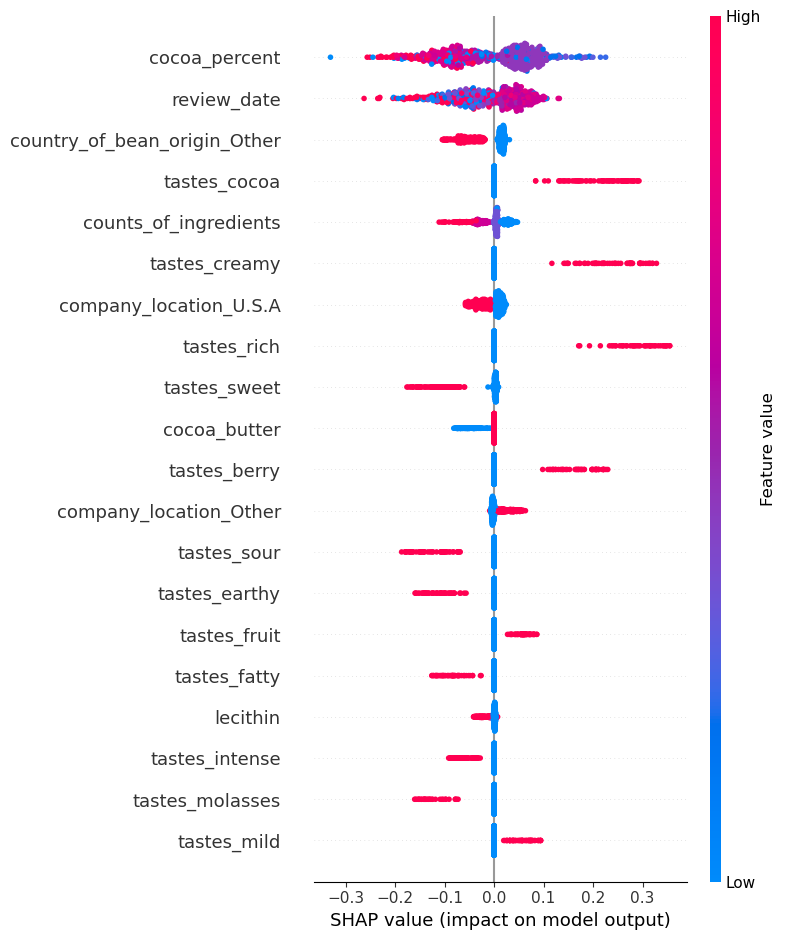

In [66]:
# Reset plotting parameters
sns.reset_orig()
plt.rcParams.update(orig_plt_params)

shap_values_class1 = shap_svm_values_test[:, :, 1]

# Create SHAP summary plot showing feature importance
# Shows impact of each feature on model output for class 1 (highly recommended)
shap.summary_plot(shap_values_class1, X_test, plot_type="dot")

### Local Interpretation for a group of predictions using Decision Plots

In [67]:
# Select sample of test indices for decision plot, only those bars that were produced by your client
sample_test_idx = X_test.index.get_indexer_for([5, 6, 7, 18, 19, 21, 24, 25, 27])

In [86]:
# One great thing about Shapley is its additivity property, which can be easily demonstrated. If you add 
# all the SHAP values to the expected value used to compute them, you get a prediction. Of course, this 
# is a classification problem, so the prediction is a probability; so, to get a Boolean array instead, we 
# have to check if the probability is greater than 0.5. We can check if this Boolean array matches our 
# model’s test dataset predictions (y_test_svc_pred)

# Get expected value (baseline prediction) for class 1
expected_value = shap_svm_explainer.expected_value[1]

# Verify SHAP values reconstruct predictions correctly
# Sum of SHAP values + expected value should equal model prediction
# Use correct indexing: [:, :, 1] for class 1 across all samples
shap_values_class1 = shap_svm_values_test[:, :, 1]  # Shape: (734, 44)

# Sum across features (axis=1) to get prediction for each sample
y_test_shap_pred = (shap_values_class1.sum(axis=1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))  # Should be True

True


In [93]:
# SHAP’s decision plot comes with a highlight feature that we can use to make false negatives (FN) stand 
# out. Now, let’s figure out which of our sample observations are FN.

# Identify False Negatives in sample
# Model predicted 0 (not recommended) but actual label is 1 (recommended)
FN = (~y_test_shap_pred[sample_test_idx]) & (y_test.iloc[sample_test_idx] == 1).to_numpy()

In [88]:
FN

array([False, False, False,  True, False, False, False,  True,  True])

In [89]:
y_test.iloc[sample_test_idx]

5     1
6     1
7     1
18    1
19    1
21    1
24    0
25    1
27    1
Name: rating, dtype: int64

In [90]:
y_test_shap_pred[sample_test_idx]

array([ True,  True,  True, False,  True,  True, False, False, False])

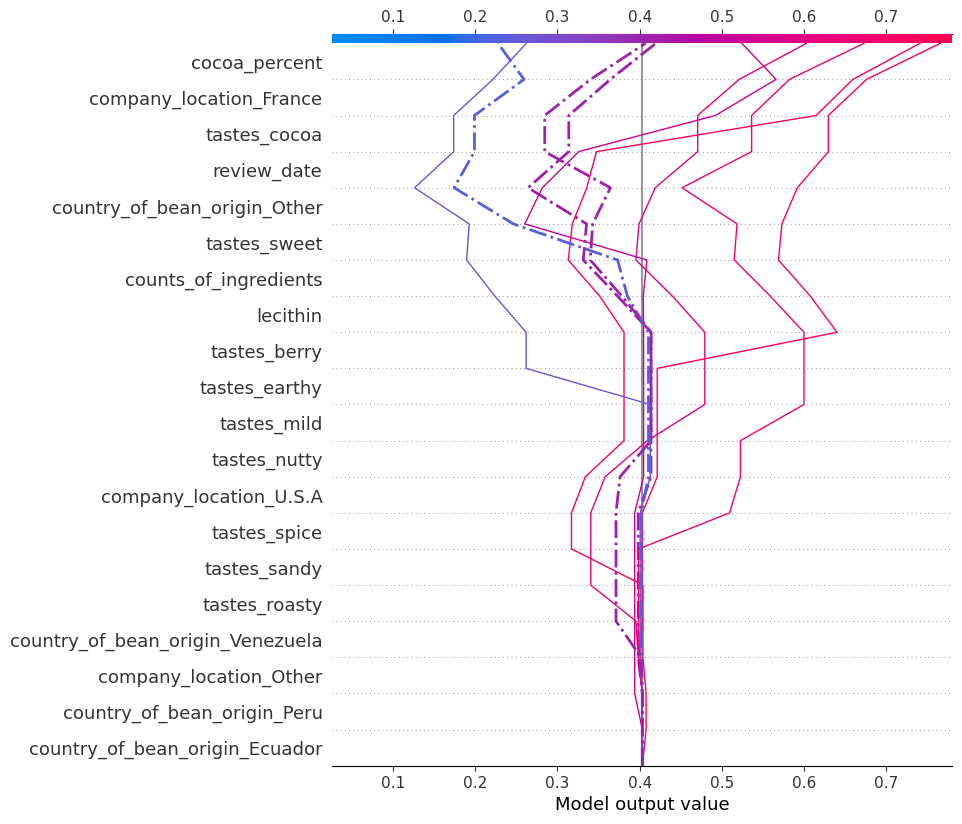

In [94]:
# We can now quickly reset and plot a decision_plot. It takes the expected_value, the SHAP values, 
# and the actual values of those items we wish to plot. Optionally, we can provide a Boolean array of 
# the items we want to highlight, with dotted lines—in this case, the false negatives (FN)

# Create decision plot showing how features push prediction from baseline
# Highlights false negatives in red
shap.decision_plot(
    expected_value, 
    shap_values_class1[sample_test_idx],
    X_test.iloc[sample_test_idx], 
    highlight=FN
)

In [96]:
# The color of each line represents not the value of any feature, but the model output. Since we used 
# predict_proba in KernelExplainer, this is a probability, but otherwise, it would have displayed SHAP 
# values, and the value they have when they strike the top x-axis is the predicted value. The features are 
# sorted in terms of importance but only among the observations plotted, and you can tell that the lines 
# increase and decrease horizontally depending on each feature. How much they vary and in which 
# direction depends on the feature’s contribution to the outcome. The gray line represents the class’s 
# expected value, which is like the intercept in a linear model. In fact, similarly, all lines start at this 
# value, making it best to read the plot from bottom to top.

# You can tell that there are three false negatives plotted in Figure 5.5 because they have dotted lines. 
# Using this plot, we can easily visualize which features made them veer toward the left the most because 
# this is what made them negative predictions. 

# For instance, we know that the leftmost false negative was to the right of the expected value line until 
# lecithin and then continued decreasing until company_location_France, and review_date increased 
# its likelihood of Highly Recommended, but it wasn’t enough. You can tell that county_of_bean_origin_
# Other decreased the likelihood of two of the misclassifications. This decision could be unfair because 
# the country could be one of over 50 countries that didn’t get their own feature. Quite possibly, there’s 
# a lot of variation between the beans of these countries grouped together.

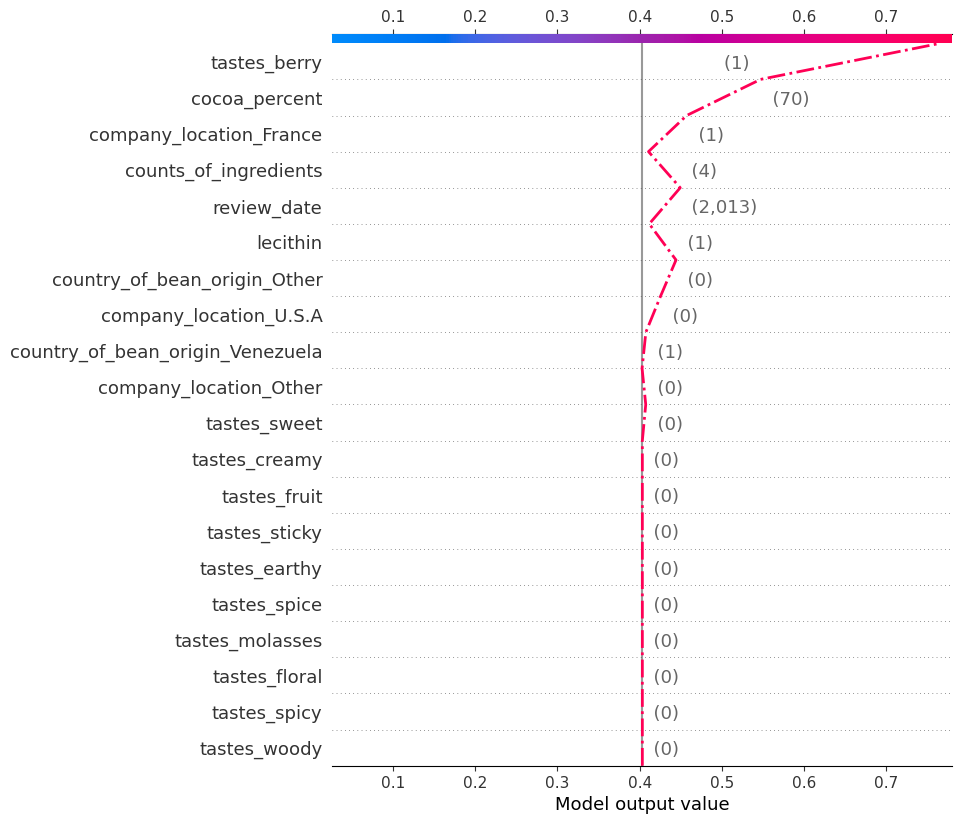

In [97]:
# Decision plot for single prediction (index 696)
shap.decision_plot(
    expected_value, 
    shap_values_class1[696],
    X_test.iloc[696], 
    highlight=0
)

In [98]:
# you can see that lecithin and counts_of_ingredients decreased the Highly Recom
# mended likelihood to a point where they could have jeopardized it. Fortunately, all features above those 
# veered the line decidedly rightward because company_location_France=1, cocoa_percent=70, and 
# tastes_berry=1 are all favorable.

### Local Interpretation for a single prediction at a time using Force Plot

In [99]:
# Set pandas display precision
pd.set_option('display.precision', 0)

# Select two chocolates for comparison (indices 5 and 24)
eval_idxs = X_test.index.isin([5, 24])
X_test_eval = X_test[eval_idxs]

# Create comparison dataframe showing actual rating, true label, prediction, and features
eval_compare_df = pd.concat([
    chocolateratings_df.iloc[X_test[eval_idxs].index].rating,
    pd.DataFrame({'y': y_test[eval_idxs]}, index=[5, 24]),
    pd.DataFrame({'y_pred': y_test_svc_pred[eval_idxs]}, index=[24, 5]),
    X_test_eval
], axis=1).transpose()

In [100]:
eval_compare_df

,24,5
rating,3,4
y,0,1
y_pred,0,1
review_date,2015,2013
cocoa_percent,70,70
counts_of_ingredients,4,4
cocoa_butter,1,1
vanilla,0,0
lecithin,1,1
salt,0,0


In [101]:
# With this DataFrame, you can confirm that they aren’t misclassifications because y=y_pred. A mis
# classification could make model interpretations unreliable for understanding why people tend to like 
# one chocolate bar more than another. Then, you can examine the features to spot the differences—for 
# instance, you can tell that the review_date is 2 years apart. Also, the beans for the Outstanding bar 
# were from Venezuela, and the Disappointing beans came from another, lesser-represented country. 
# The Outstanding one had a berry taste, and the Disappointing one was earthy.

In [102]:
# The force plot can tell us a complete story of what weighed in the model’s decisions (and, presumably, 
# the reviewers’), and gives us clues as to what consumers might prefer. Plotting a force_plot requires 
# the expected value for the class of your interest (expected_value), the SHAP values for the observation 
# of your interest, and this observation’s actual values.

In [103]:
# Initialize JavaScript for interactive SHAP plots
shap.initjs()

# Force plot for index 5 (highly recommended chocolate)
# Shows how each feature pushes prediction higher (red) or lower (blue)
shap.force_plot(
    expected_value, 
    shap_values_class1[X_test.index==5],
    X_test[X_test.index==5]
)
# Key features: company_location_France (positive), review_date, tastes_berry

In [105]:
# Force plot for index 24 (not highly recommended chocolate)
shap.force_plot(
    expected_value, 
    shap_values_class1[X_test.index==24],
    X_test[X_test.index==24]
)
# Key features: cocoa_percent, company_location_France, tastes_earthy

## Employing Local Interpretable Model-agnostic Explanations (LIME)

In [106]:
# EMPLOYING LIME (LOCAL INTERPRETABLE MODEL-AGNOSTIC EXPLANATIONS)
#
# RECAP: GLOBAL-FOCUSED INTERPRETATION METHODS
# This section contrasts LIME with the methods previously covered (like global SHAP or Permutation Importance).
#
# - HOW PREVIOUS METHODS WORK (e.g., Global SHAP):
#   - They start with a dataset of many observations.
#   - They perform simulations, pushing variations of the data through the model.
#   - Their goal is to understand the connection between inputs (X) and predictions (y_pred) across the ENTIRE dataset.
#   - The primary output → YIELD GLOBAL FEATURE IMPORTANCE and interaction effects.
#
# - THE KEY LIMITATION:
#   - While some of these methods (like SHAP) can be observed locally, their foundation is global.
#   - ⚠ A CRITICAL CAVEAT: What is quantified as important GLOBALLY may not accurately apply or be the most important factor LOCALLY for a single, specific prediction.
#
# THE LIME APPROACH: A SHIFT TO LOCAL-FIRST INTERPRETATION
# LIME introduces a different philosophy, designed to address this limitation.
#
# - A method designed specifically and exclusively for LOCAL interpretation.
# - Instead of starting globally and trying to apply it locally, LIME starts and ends with a single prediction.
# - It answers the question: "Why was THIS specific prediction made?" not "How does the model work overall?"
# - It is built from the ground up to quantify the local effects of features for explaining just one instance at a time.

In [107]:
# WHAT IS LIME? (LOCAL INTERPRETABLE MODEL-AGNOSTIC EXPLANATIONS)
#
# THE CORE IDEA: EXPLAINING A BLACK BOX WITH A WHITE BOX
# - LIME is a model-agnostic method that explains a SINGLE prediction by training a SIMPLE, INTERPRETABLE "surrogate" model on the local region around that prediction.
# - It does not try to explain the entire model, only one prediction at a time.
#
# HOW LIME WORKS (THE PROCESS):
# 1. SELECT AN 'INSTANCE' TO EXPLAIN: You choose the specific data point (row/observation) you want to understand.
#
# 2. GENERATE A NEIGHBORHOOD VIA PERTURBATION:
#    - LIME creates a new, temporary dataset by generating many variations of the original instance.
#    - It does this by adding "noise" or slightly changing the feature values (perturbing them).
#
# 3. GET BLACK-BOX PREDICTIONS: The original, complex black-box model makes a prediction for each of these new, perturbed data points.
#
# 4. WEIGHT THE PERTURBED SAMPLES:
#    - LIME calculates the "distance" of each new point from the original instance.
#    - It then assigns a higher weight to points that are CLOSER and a lower weight to points that are farther away. This defines the "neighborhood."
#
# 5. TRAIN A SIMPLE, INTERPRETABLE SURROGATE MODEL:
#    - LIME fits a simple model (like a sparse linear model) on the perturbed dataset.
#    - Crucially, this training process uses the weights from Step 4. This means the surrogate model focuses on accurately mimicking the black-box model's behavior ONLY in the immediate vicinity of the original instance.
#
# 6. EXTRACT THE EXPLANATION FROM THE SURROGATE MODEL:
#    - The explanation for the original prediction IS the set of parameters from the simple surrogate model (e.g., the coefficients of the linear model).
#
# KEY TERMINOLOGY UNPACKED:
# - ✓ Instance: The chosen data point you want to interpret.
# - ✓ Perturbation: The process of creating new, slightly modified samples around the instance.
# - ✓ Weighting Scheme: An exponential kernel is used to weigh samples based on their proximity to the instance.
# - ✓ Closer: Distance is measured using Euclidean distance (for tabular data) or cosine similarity (for text data).
# - ✓ Intrinsically Interpretable Surrogate Model: Typically a sparse, regularized linear model. Its coefficients directly serve as the feature importance values for the local explanation.
#
# THE CORE INTUITION & ASSUMPTION:
# - Intuition (like k-NN): Points that are close together in feature space should behave similarly.
# - ⚠ THE BIG ASSUMPTION: LIME assumes that even the most complex, non-linear model is approximately LINEAR at a very small, local level.
# - Goal of the Surrogate: The surrogate's own predictive accuracy is not the main goal. Its sole purpose is to provide interpretable coefficients that explain the black-box model's local behavior.
#
# STRENGTHS & CAVEATS:
# ✓ High Local Fidelity: LIME can approximate the black-box model's predictions very well within a local neighborhood.
# ✓ Versatile: Works for tabular, image, and text data.
# ⚠ Contingent on Neighborhood Definition: The quality of the explanation heavily depends on the "kernel width," which defines the size of the neighborhood. An incorrect width can lead to a poor explanation.
# ⚠ Contingent on Local Linearity: The explanation is only reliable if the "local linearity" assumption actually holds true for that specific region of the data.

### Local Interpretation for a single prediction at a time using LimeTabularExplainer

In [111]:
# LOCAL INTERPRETATION WITH LIMETABULAREXPLAINER
# This is the practical implementation of LIME for tabular data.
#
# STEP 1: INSTANTIATE THE EXPLAINER
# To explain a single prediction, you must first create an explainer object.
# It requires several key pieces of information about your dataset:
#
# - ✓ The Training/Sample Data: Must be a NumPy 2D array (e.g., `X_test.values`).
#
# - ✓ Feature Names: A list of column names (e.g., `X_test.columns`).
#   - This is optional but highly recommended for human-readable explanations.
#
# - ✓ Categorical Feature Indices: A list of the column indices that are categorical.
#   - ⚠ This is CRITICAL. LIME treats categorical and continuous features differently during perturbation.
#   - Failing to specify this can lead to a poor-fitting local surrogate and a bad explanation.
#
# - ✓ Class Names: A list of the target class names (e.g., ['Not Recommended', 'Recommended']).
#   - Also optional but recommended for clarity.
#
# THE MOST IMPORTANT PARAMETER: `kernel_width`
# - Definition: This parameter defines the diameter (size) of the neighborhood around the instance being explained.
# - The Core Question It Answers: "What is considered local?"
# - Default Value: It has a default, but this default may not be optimal for your specific data or instance.
# - ⚠ Tuning is often required: You may need to adjust `kernel_width` on an INSTANCE-BY-INSTANCE basis to ensure the explanation is consistent and makes sense.
#
# MANAGING INCONSISTENCY
# LIME's results can sometimes vary between runs. This is a known challenge.
#
# - The Cause: The RANDOM nature of the PERTURBATION process used to create the neighborhood.
# - The Relationship with `kernel_width`:
#   - LARGE neighborhood → HIGH variability / inconsistent results.
#   - SMALLER neighborhood → LOW variability / more consistent results.
#
# - Best Practice: If you are seeing inconsistent explanations for the same instance, try reducing the `kernel_width`.

In [108]:
# Initialize LIME explainer for tabular data
# Creates local linear approximations around predictions
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_test.values,
    feature_names=X_test.columns, 
    categorical_features=list(range(len(X_test.columns))),  # All features treated as categorical
    class_names=['Not Highly Recomm.', 'Highly Recomm.'],
    discretize_continuous=True
)

In [109]:
# Explain prediction for index 5
# num_features=8: show top 8 most important features
lime_svm_explainer.explain_instance(
    X_test[X_test.index==5].values[0],
    fitted_svm_mdl.predict_proba,
    num_features=8
).show_in_notebook(predict_proba=True)
# Prediction: 77% Highly Recommended
# Key features: tastes_rich=0, tastes_creamy=0, tastes_cocoa=0, tastes_berry=1

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [110]:
# This figure can be read as other feature 
# importance plots with the most influential features having the highest coefficients – and vice versa. 
# However, it has features that weigh in each direction. According to the local surrogate, a cocoa_percent 
# value smaller or equal to 70 is a favorable attribute, as is the berry taste. A lack of sour, sweet, and 
# molasses tastes also weighs favorably in this model. However, a lack of rich, creamy, and cocoa tastes 
# does the opposite, but not enough to push the scales toward Not Highly Recommended

In [112]:
# Explain prediction for index 24
lime_svm_explainer.explain_instance(
    X_test[X_test.index==24].values[0],
    fitted_svm_mdl.predict_proba,
    num_features=8
).show_in_notebook(predict_proba=True)
# Prediction: 74% Not Highly Recommended
# Key features: Similar absences but tastes_berry=0 (negative impact)

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [113]:
# THE SCENARIO: COMPARING TWO SIMILAR CHOCOLATE BARS (#5 vs. #24)
# - Observation #5: Rated "Highly Recommended."
# - Observation #24: Rated "Disappointing."
# - The Problem: The two chocolate bars are very similar in their features, yet their LIME explanations
#   (when limited to the top 8 features) appear to be differentiated by a single feature: `tastes_berry`.
#
# THE CONFLICT: LIME's LOCAL VIEW vs. SHAP's GLOBAL VIEW
# - LIME's Explanation → The key difference between the two bars' predictions seems to be the presence/absence of `tastes_berry`.
# - SHAP's Explanation → Globally, SHAP identified `tastes_earthy=1` as a primary reason for the "Disappointing" rating of bar #24.
# - ⚠ The Question: Why did LIME's local explanation seem to miss the more globally important (`tastes_earthy`) feature?
#
# THE ROOT CAUSE: HOW LIME'S LOCAL NATURE CAN BE MISLEADING
# The text identifies a twofold reason for this discrepancy.
#
# 1. THE NEIGHBORHOOD COMPOSITION PROBLEM:
#    - ✓ Both instances (#5 and #24) are close and fall within the same local neighborhood for LIME's analysis.
#    - ⚠ The local sample within this neighborhood is skewed: it contains MANY examples with `tastes_berry` but VERY FEW examples with `tastes_earthy`.
#    - The Result → Because `tastes_earthy` is rare *locally*, LIME's surrogate model doesn't see it as a significant differentiator *within this specific sample*. It instead attributes the prediction difference to other features that vary more frequently in the neighborhood.
#
# 2. INHERENT LIMITATIONS OF LIME AT PLAY:
#    - The Local Neighborhood Might Be Too Small: The chosen `kernel_width` might create a neighborhood that isn't representative enough to capture the true importance of rare features.
#
#    - The Bias of the Linear Surrogate Model:
#      - LIME uses a simple linear model, which is on the "bias" end of the bias-variance trade-off (it makes strong, simplifying assumptions).
#      - This bias is EXACERBATED by feature imbalance WITHIN the neighborhood.
#      - The model will naturally give more importance to common features it sees frequently (`tastes_berry`) over rare but globally impactful ones (`tastes_earthy`).

## Using LIME for Natural Language Processing

In [122]:
# THE NLP DATASET:
# - The data consists of a series of strings, where each string is a collection of taste descriptors.
# - Example: "rich roasty nutty smoke"
#
# THE CORE PROBLEM: MODELS NEED NUMBERS, NOT TEXT
# - No machine learning model can directly ingest raw text.
# - The text must be converted into a numerical format, a process called "vectorization."
#
# THE CHOSEN VECTORIZATION METHOD: TF-IDF
# - Term Frequency-Inverse Document Frequency (TF-IDF) is selected as the ideal method.
# - Why TF-IDF is a good fit for this problem:
#   - ✓ We are interested in the RELATIVE OCCURRENCE of words.
#   - ⚠ We are NOT interested in word position or complex semantics.
#
# HOW TF-IDF WORKS:
# - It evaluates how important a word (a "term") is to a specific document (a "phrase") within a collection of documents (the "corpus").
# - It's a two-part calculation:
#   1. TERM FREQUENCY (TF): How often a word appears in a single phrase.
#   2. INVERSE DOCUMENT FREQUENCY (IDF): This is a weighting factor.
#      - Words that are very common across ALL phrases (e.g., "sweet") get a lower weight.
#      - Words that are rare across all phrases get a higher weight.
#
# PRACTICAL IMPLEMENTATION WITH `TfidfVectorizer`
# - The tool used is `TfidfVectorizer` from scikit-learn.
#
# - ⚠ THE CRITICAL RULE FOR FITTING:
#   - You MUST `fit` (or `fit_transform`) the vectorizer ONLY on the TRAINING DATA (`X_train_nlp`).
#   - Then, you use that SAME FITTED vectorizer to `transform` the TEST DATA (`X_test_nlp`).
#   - Why? This ensures that both datasets have a consistent vocabulary and consistent scoring for each word.
#
# INSPECTING THE TF-IDF OUTPUT
# - The output of the vectorizer is a "sparse matrix," which needs to be converted (e.g., with `.todense()`) to be easily viewed.
# - The TF-IDF scores are normalized values (typically between 0 and 1).
# - A higher score means a word is more important to that specific phrase.
#
# ✓ INSIGHT FROM INSPECTION (THE "RASPBERRY" DISCOVERY):
# - By inspecting the TF-IDF scores for observation #5, the word "raspberry" is found.
# - This connects back to the previous tabular analysis, explaining WHY the `tastes_berry` column was `1` for that observation.
# - The original categorical encoding method had searched for the substring "berry" and found it within "raspberry".
# - This is not a problem, as a raspberry is a type of berry, and it provides a useful link between the two datasets.

In [114]:
# Display NLP training data (taste descriptions)
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [115]:
# Create TF-IDF vectorizer
# Converts text to numerical features based on term frequency-inverse document frequency
vectorizer = TfidfVectorizer(lowercase=False)

# Fit vectorizer on training data and transform both train and test
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

In [120]:
# Set display precision for decimals
pd.set_option('display.precision', 6)

# Show TF-IDF scores for taste words in chocolate at index 5
pd.DataFrame({
    'taste': vectorizer.get_feature_names_out(),
    'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense()).reshape(-1)
}).sort_values(by='tf-idf', ascending=False).head(5)
# Top words: raspberry (0.586), nut (0.492), oily (0.464), caramel (0.448)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
386,unbalanced,0.000000


### Train LightGBM Model

In [123]:
# WHAT IS LIGHTGBM?
# - A very popular and high-performance gradient-boosting framework.
# - Like XGBoost, it uses boosted-tree ensembles and histogram-based splitting.
#
# KEY DIFFERENCES FROM XGBOOST
# The main differences lie in their core algorithms for speed and efficiency.
#
# 1. SPLITTING ALGORITHMS:
#    - ✓ LightGBM: Uses two key techniques for speed:
#      - GOSS (Gradient-Based One-Side Sampling): Focuses on data points with larger gradients (more "error") and samples the rest.
#      - EFB (Exclusive Feature Bundling): Bundles sparse features together to reduce dimensionality.
#    - ⚠ XGBoost: Uses more "rigorous" (and often slower) methods like Weighted Quantile Sketch and Sparsity-aware Split Finding.
#
# 2. TREE GROWTH STRATEGY:
#    - ✓ LightGBM: Grows trees BREADTH-FIRST (leaf-wise or "best-first"), expanding the leaf that will yield the largest reduction in loss.
#    - ⚠ XGBoost: Grows trees DEPTH-FIRST (top-down), completing one level before moving to the next.
#
# THE PERFORMANCE TRADE-OFF
# These algorithmic differences lead to a clear trade-off:
#
# - ✓ SPEED: LightGBM is usually EVEN FASTER than XGBoost, primarily due to GOSS.
# - ⚠ ACCURACY: LightGBM can sometimes lose a small amount of predictive performance because the sampling in GOSS is an approximation.
# - ✓ RECOVERY: It often regains this performance with its "best-first" tree growth strategy.
#
# WHY LIGHTGBM FOR THIS NLP TASK?
# - THE PUNCHLINE: The key is EFB (Exclusive Feature Bundling).
# - EFB makes LightGBM extremely EFFICIENT and EFFECTIVE for training on SPARSE FEATURES.
# - Our vectorized NLP data (`X_train_nlp_fit`) from the TF-IDF process is a large sparse matrix.
# - Therefore, LightGBM is the ideal choice for this specific exercise due to its speed and optimization for sparse data.

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


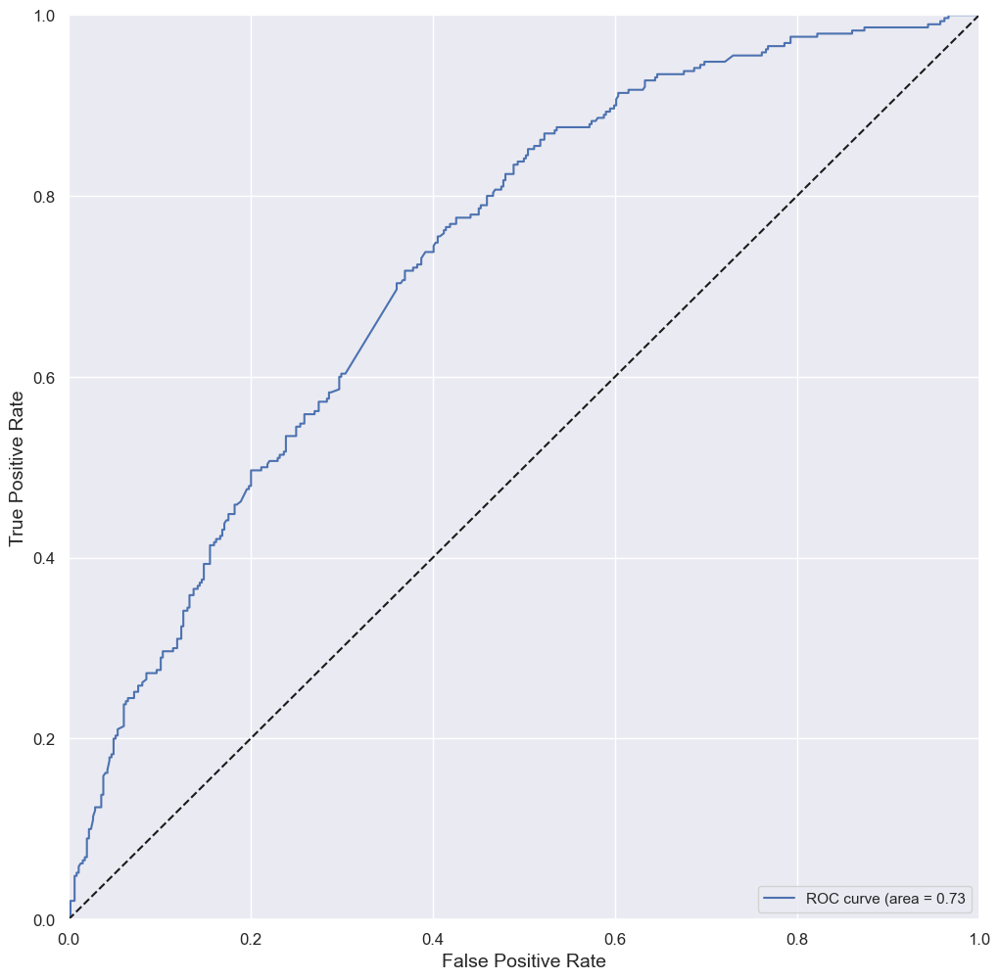

Accuracy_train:  0.7980		Accuracy_test:   0.6744
Precision_test:  0.6123		Recall_test:     0.4793
ROC-AUC_test:    0.7298		F1_test:         0.5377		MCC_test: 0.2973


In [124]:
sns.set()

# Initialize LightGBM classifier
# Gradient boosting model optimized for speed and accuracy
lgb_mdl = lgb.LGBMClassifier(
    max_depth=13, 
    learning_rate=0.05,
    n_estimators=100, 
    objective='binary', 
    verbose=-1, 
    force_row_wise=True,
    random_state=rand
)

# Train on TF-IDF transformed taste descriptions
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)

# Evaluate model performance
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred = mldatasets.evaluate_class_mdl(
    fitted_lgb_mdl, 
    X_train_nlp_fit,
    X_test_nlp_fit, 
    y_train, 
    y_test
)

In [125]:
# the performance achieved by LightGBM is slightly lower than for the SVM
# but it’s still pretty good, safely above the coin-toss line. The comments for the SVM about favoring 
# precision over recall for this model also apply here.

### Local Interpretation for a single prediction at a time using LimeTextExplainer

In [ ]:
# THE CORE CHALLENGE FOR NLP EXPLANATIONS
# - LIME's internal mechanism requires NUMERICAL data, not raw text. The black-box model itself was trained on vectorized (TF-IDF) data.
# - However, for interpretation, we want to provide the original, human-readable text and see which words were important.
# - The Problem: How do we bridge this gap? We need a way to automatically vectorize any text we want to explain on the fly.
#
# THE SOLUTION: USING A SCIKIT-LEARN PIPELINE
# - A pipeline is a tool that chains together multiple data processing and modeling steps into a single, cohesive object.
# - `make_pipeline` from scikit-learn is used to create this sequence.
#
# - OUR SPECIFIC PIPELINE:
#   1. Step 1 (Transform): The `TfidfVectorizer` (our `vectorizer` object). Its job is to take raw text and convert it into a TF-IDF sparse matrix.
#   2. Step 2 (Predict): The LightGBM model (our `lgb_mdl` object). Its job is to take the transformed matrix and make a prediction.
#
# WHY THIS IS IDEAL FOR LIME
# ✓ LIME needs a single, unified prediction function (like `predict_proba`) that can accept the raw data format.
# ✓ The pipeline object has its OWN `.predict_proba()` method.
# ✓ When LIME calls `pipeline.predict_proba(some_raw_text)`, the pipeline automatically performs both steps internally:
#   - It first passes the text through the `vectorizer`.
#   - It then passes the resulting numbers to the `lgb_mdl` for a prediction.
# ✓ This makes the entire vectorization-then-prediction process seamless and invisible to LIME, allowing it to work directly with text.
#
# THE LIME PROCESS REMAINS THE SAME:
# - LIME will still perturb the data (by removing words from the text string).
# - It will then feed each perturbed string into the pipeline's `predict_proba` function.
# - It then trains its local, simple linear model on these results to determine which words had the most impact on the final prediction.

In [126]:
# Create pipeline combining vectorizer and model
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [127]:
# Initializing a LimeTextExplainer is pretty simple. All parameters are optional, but it’s recommended 
# to specify names for your classes. Just as with LimeTabularExplainer, a kernel_width optional pa
# rameter can be critical because it defines the neighborhood’s size, and there’s a default that may not 
# be optimal but can be tuned on an instance-by-instance basis.

# Initialize LIME text explainer
# Explains predictions by perturbing input text (removing words)
lime_lgb_explainer = LimeTextExplainer(
    class_names=['Not Highly Recomm.', 'Highly Recomm.']
)

In [129]:
# Explain prediction for index 5: "oily nut caramel raspberry"
lime_lgb_explainer.explain_instance(
    X_test_nlp[X_test_nlp.index==5].values[0],
    lgb_pipeline.predict_proba, 
    num_features=4
).show_in_notebook(text=True)
# Prediction: 51% Highly Recommended

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [141]:
lgb_pipeline.predict_proba(X_test_nlp[X_test_nlp.index==5])

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


array([[0.48710849, 0.51289151]])

In [142]:
# Get LIME explanation
exp = lime_lgb_explainer.explain_instance(
    X_test_nlp[X_test_nlp.index==5].values[0],
    lgb_pipeline.predict_proba,
    num_features=4
)

In [152]:
exp.intercept

{1: np.float64(0.4257953050208316)}

In [130]:
# According to the LIME text explainer (see Figure 5.14), the model predicts Highly Recommended for 
# observation #5 because of the word caramel. At least according to the local neighborhood, raspberry 
# is not a factor. In this case, the local surrogate is making a different prediction from the LightGBM 
# model. In some cases, the LIME prediction disagrees with the model prediction. If the disagreement 
# rate is too high, we would refer to this as “low fidelity.”

In [153]:
# Explain prediction for index 24: "burnt wood earthy choco"
lime_lgb_explainer.explain_instance(
    X_test_nlp[X_test_nlp.index==24].values[0],
    lgb_pipeline.predict_proba, 
    num_features=4
).show_in_notebook(text=True)
# Prediction: 72% Not Highly Recommended
# Key words: wood, earthy, choco, burnt (all negative)

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [154]:
lgb_pipeline.predict_proba(X_test_nlp[X_test_nlp.index==24])

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


array([[0.71565832, 0.28434168]])

In [155]:
# Get LIME explanation
exp = lime_lgb_explainer.explain_instance(
    X_test_nlp[X_test_nlp.index==24].values[0],
    lgb_pipeline.predict_proba,
    num_features=4
)

In [156]:
exp.intercept

{1: np.float64(0.18512167756320327)}

In [157]:
# --- Test with Custom Examples ---

# Positive taste description
lime_lgb_explainer.explain_instance(
    'creamy rich complex fruity',
    lgb_pipeline.predict_proba, 
    num_features=4
).show_in_notebook(text=True)
# Prediction: 94% Highly Recommended - all positive words

# Negative taste description
lime_lgb_explainer.explain_instance(
    'sour bitter roasty molasses',
    lgb_pipeline.predict_proba, 
    num_features=4
).show_in_notebook(text=True)
# Prediction: 99% Not Highly Recommended - bitter and sour are negative

# Unknown words (not in training vocabulary)
lime_lgb_explainer.explain_instance(
    'nasty disgusting gross stuff',
    lgb_pipeline.predict_proba, 
    num_features=4
).show_in_notebook(text=True)
# Prediction: 59% Not Highly Recommended - unknown words have minimal impact

C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


C:\Users\ASUS\miniconda3\envs\DataVis\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [158]:
# you’d be mistaken to think that the prediction of Not Highly Recommended for nasty dis
# gusting gross stuff has anything to do with the words. The LightGBM model hasn’t seen these words 
# before, so the prediction has more to do with Not Highly Recommended being the majority class, which 
# is a good guess, and the sparse matrix for this phrase is all zeros. Therefore, LIME likely found few 
# distant points—if any at all—in its neighborhood, so the zero coefficients of LIME’s local surrogate 
# model reflect this.

## Trying SHAP for Natural Language Processing

In [159]:
# Most of SHAP’s explainers will work with tabular data. DeepExplainer can do text but is restricted to 
# deep learning models, and three of them do images, including KernelExplainer. In fact, SHAP’s KernelExplainer was designed 
# to be a general-purpose, truly model-agnostic method, but it’s not promoted as an option for NLP. It is 
# easy to understand why: it’s slow, and NLP models tend to be very complex and with hundreds—if not 
# thousands—of features to boot. In cases such as this one, where word order is not a factor and you have 
# a few hundred features, but the top 100 are present in most of your observations, KernelExplainer 
# could work.

In [161]:
# In addition to overcoming the high computation cost, there are a couple of technical hurdles you 
# would need to overcome. One of them is that KernelExplainer is compatible with a pipeline, but it 
# expects a single set of predictions back. But LightGBM returns two sets, one for each class: Not Highly 
# Recommended and Highly Recommended. To overcome this problem, we can create a lambda function 
# (predict_fn) that includes a predict_proba function, which returns only those predictions for Highly 
# Recommended.

# Create prediction function that returns probability for class 1
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:, 1]

  0%|          | 0/100 [00:00<?, ?it/s]

C:\Users\ASUS\AppData\Local\Temp\ipykernel_20664\1348206833.py:32: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


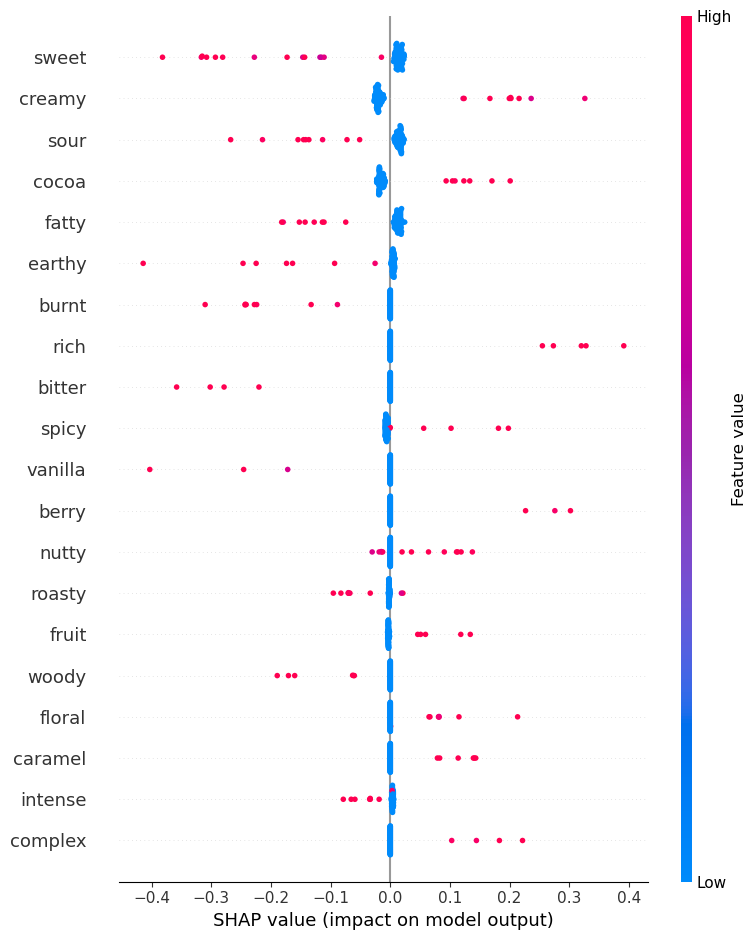

In [163]:
# The second technical hurdle is to do with SHAP’s incompatibility with SciPy’s sparse matrices, and 
# for our explainer, we will need sample vectorized test data, which is in this format. To overcome this 
# issue, we can convert our data in the SciPy sparse-matrix format in to a numpy matrix and then in to 
# a pandas DataFrame (X_test_nlp_samp_df). To overcome any slowness, we can use the same kmeans 
# trick we used last time. Other than the adjustments made to overcome obstacles, the following code 
# is exactly the same as SHAP performed with the SVM model

import warnings
warnings.filterwarnings('ignore', category=UserWarning)

# Reset plotting parameters
sns.reset_orig()
plt.rcParams.update(orig_plt_params)

# Convert first 100 test samples to dense dataframe for SHAP
X_test_nlp_samp_df = pd.DataFrame(X_test_nlp_fit[:100].todense())

# Initialize SHAP explainer with k-means summary of training data
shap_lgb_explainer = shap.KernelExplainer(
    predict_fn,
    shap.kmeans(X_train_nlp_fit.toarray(), 10)
)

# Compute SHAP values for sample
# This can be slow for text data with many features
shap_lgb_values_test = shap_lgb_explainer.shap_values(
    X_test_nlp_samp_df,
    l1_reg="num_features(20)"
)

# Create summary plot showing most important taste words
shap.summary_plot(
    shap_lgb_values_test, 
    X_test_nlp_samp_df,
    plot_type="dot", 
    feature_names=vectorizer.get_feature_names_out()
)

In [164]:
# you can tell that globally the words creamy, rich, cocoa, 
# fruit, spicy, nutty, and berry have a positive impact on the model toward predicting Highly Recom
# mended. On the other hand, sweet, sour, earthy, hammy, sandy, and fatty have the opposite effect. 
# These results shouldn’t be entirely unexpected given what we learned with our prior SVM model, with 
# the tabular data and local LIME interpretations. That being said, the SHAP values were derived from 
# samples of a sparse matrix, and they could be missing details and perhaps even be partially incorrect, 
# especially for underrepresented features. Therefore, we should take the conclusions with a grain of 
# salt, especially toward the bottom half of the plot. To increase the interpretation fidelity, it’s best to 
# increase sample size, but given the slowness of KernelExplainer, there’s a trade-off to consider.

In [166]:
# Now that we have validated our SHAP values globally, we can use them for local interpretation with 
# a force plot. Unlike LIME, we cannot use arbitrary data for this. With SHAP, we are limited to those 
# data points we have previously generated SHAP values for. For instance, let’s take the 18th observation 
# from our test dataset sample

# Find chocolate with "woody earthy medicinal" description (index 1002)
pos = X_test_nlp.index.get_loc(1002)
print(X_test_nlp.to_list()[pos])

woody earthy medicinal


In [167]:
# Force plot showing word contributions
shap.force_plot(
    shap_lgb_explainer.expected_value, 
    shap_lgb_values_test[pos, :],
    X_test_nlp_samp_df.iloc[pos, :], 
    feature_names=vectorizer.get_feature_names_out()
)
# earthy and woody push prediction toward "not recommended"

In [173]:
# the force plot for woody earthy medicinal. As you can tell, earthy and woody weigh 
# heavily in a prediction against Highly Recommended. The word medicinal is not featured in the force 
# plot and instead you get a lack of creamy and cocoa as negative factors. As you can imagine, medicinal 
# is not a word used often to describe chocolate bars, so there was only one observation in the sampled 
# dataset that included it. Therefore, its average marginal contribution across possible coalitions would 
# be greatly diminished

In [175]:
# Force plot for this chocolate
shap.force_plot(
    shap_lgb_explainer.expected_value, 
    shap_lgb_values_test[pos, :],
    X_test_nlp_samp_df.iloc[pos, :], 
    feature_names=vectorizer.get_feature_names_out()
)
# spicy has positive impact toward "highly recommended"

In [177]:
# As you can appreciate in Figure 5.19, all the words in the phrase are featured in the force plot: floral and 
# spicy pushing toward Highly Recommended, and intense toward Not Highly Recommended.

In [178]:
# COMPARING SHAP WITH LIME: STRENGTHS & LIMITATIONS
#
# SHAP (SHAPLEY ADDITIVE EXPLANATIONS)
#
# ✓ STRENGTHS:
#   - Grounded in Theory: Based on solid cooperative game theory (Shapley values).
#   - Consistent & Reliable Properties: The SHAP values have desirable properties like:
#     - Additivity: The contributions sum up to the final prediction.
#     - Efficiency: The explanation is a complete allocation of the prediction.
#   - No Parameter Tuning for Consistency: The core explanation "always adds up" without needing manual tuning.
#   - Global & Local Views: While often used globally, it provides local explanations as well.
#
# ⚠ LIMITATIONS:
#   - Violates the Dummy Property: Can sometimes assign importance to features that should have none.
#   - Slow (Specifically KernelExplainer): The most model-agnostic version, `KernelExplainer`, is "painfully slow" and computationally expensive.
#   - Unrealistic Data Problem: `KernelExplainer` deals with missing features by randomly sampling from a background set, which can put too much weight on unlikely or impossible data points, especially with correlated features.
#   - Better Suited for Global: The text suggests it's generally more suited for global interpretations.
#
# LIME (LOCAL INTERPRETABLE MODEL-AGNOSTIC EXPLANATIONS)
#
# ✓ STRENGTHS:
#   - Speedy: Very fast to compute explanations for single instances.
#   - Highly Model-Agnostic: Works easily with any black-box model.
#   - Adaptable: Flexible and works well for all kinds of data (tabular, text, and image).
#   - Intuitive: Based on the simple and understandable idea that "neighbors are alike."
#
# ⚠ LIMITATIONS:
#   - Not Grounded in Strict Theory: Relies on an intuition rather than a strict mathematical framework like Shapley values.
#   - Tricky Parameter Tuning: Requires careful, often instance-by-instance, tuning of parameters like `kernel_width` to define the neighborhood size optimally. A poor choice leads to a bad explanation.
#   - Strictly Local: It is ONLY suitable for local interpretations and cannot be aggregated to create a reliable global view.

In [179]:
# MISSION ACCOMPLISHED: EXPLAINING THE CHOCOLATE BAR RATINGS
#
# THE GOAL: To understand why one of the client's bars was rated "Outstanding" and another was rated "Disappointing".
# THE APPROACH: Used local interpretation methods (SHAP and LIME) on both tabular and NLP models.
#
# KEY FINDINGS & CONCLUSIONS:
#
# ✓ FROM THE TABULAR MODEL (SHAP):
#   - Outstanding Bar: Its high rating is primarily due to `tastes_berry` and a `cocoa_percent` of 70%.
#   - Disappointing Bar: Its low rating is mostly due to its `tastes_earthy` flavor and a less desirable `bean_country_of_origin`.
#
# ✓ FROM THE TABULAR MODEL (LIME):
#   - Confirmed `cocoa_percent <= 70%` is desirable.
#   - Favorable Tastes: `berry`, `creamy`, `cocoa`, `rich`.
#   - Unfavorable Tastes: `sweet`, `sour`, `molasses`.
#
# ✓ OVERALL INSIGHT (Bridging Tabular & NLP):
#   - The most salient and impactful features identified by BOTH methods were TASTE-RELATED.
#   - This strongly justified the need for a separate NLP model to analyze the descriptive words in more detail.
#
# ✓ FROM THE NLP MODEL (LIME - LOCAL):
#   - Outstanding Bar ("oily nut caramel raspberry"):
#     - `caramel` = POSITIVE driver of the prediction.
#     - `oily` = NEGATIVE driver.
#     - `nut` & `raspberry` were neutral for this specific prediction.
#   - Disappointing Bar ("burnt wood earthy choco"):
#     - `burnt` & `earthy` = NEGATIVE drivers.
#     - `wood` & `choco` = Favorable drivers.
#
# ✓ FROM THE NLP MODEL (SHAP - GLOBAL):
#   - Globally Positive Words: `creamy`, `rich`, `cocoa`, `fruit`, `spicy`, `nutty`, `berry`.
#   - Globally Negative Words: `sweet`, `sour`, `earthy`, `hammy`, `sandy`, `fatty`.
#
# ACTIONABLE RECOMMENDATION FOR THE CLIENT:
# - With these specific insights, the client can now adjust their chocolate bar formulas to appeal to a broader audience.
# - They can focus on incorporating globally positive tastes while avoiding the negative ones.
# - ⚠ CRITICAL ASSUMPTION: This advice is only valid if the Manhattan Chocolate Society is truly representative of the client's target audience.
#
# THE VALUE OF MACHINE LEARNING INTERPRETATION (WHY NOT JUST USE COMMON SENSE?)
# 1. DATA-DRIVEN CONCLUSION vs. OPINION: Without the data and models, concluding that "burnt" is bad is just an opinion. The model provides evidence-based validation.
# 2. CONTEXT IS EVERYTHING: Humans are terrible at objectively placing one data point in the context of thousands of others. ML models excel at this, providing a contextualized and unbiased perspective.
#
# BEYOND A SINGLE EXPLANATION & LOOKING FORWARD:
# - Local interpretation isn't just about one point; it reveals how the model behaves for ALL SIMILAR points in that "local neighborhood."
# - NEXT CHAPTER: We will expand on this neighborhood concept by exploring:
#   - ANCHORS: What features are the commonalities that lock in a prediction?
#   - COUNTERFACTUALS: What is the smallest change needed to flip a prediction?

In [180]:
# KEY TAKEAWAYS
# 
# 1. SHAP provides consistent feature attributions based on game theory
#    - Shows how each feature contributes to moving prediction from baseline
#    - Works for both tabular and text data
# 
# 2. LIME provides local linear approximations around predictions
#    - Easier to interpret for individual predictions
#    - Can handle any black-box model
# 
# 3. For chocolate ratings:
#    - Positive tastes: creamy, rich, fruity, complex, berry
#    - Negative tastes: bitter, sour, burnt, earthy, medicinal
#    - Model can predict recommendations from taste descriptions alone
# 
# 4. Both methods help build trust in model predictions by explaining
#    which features drove specific decisions